#ORB

In [1]:
!git clone https://github.com/chenchkx/ETH-80.git
import os
import cv2
import numpy as np

Cloning into 'ETH-80'...
remote: Enumerating objects: 6745, done.
remote: Total 6745 (delta 0), reused 0 (delta 0), pack-reused 6745
Receiving objects: 100% (6745/6745), 307.92 MiB | 44.28 MiB/s, done.
Resolving deltas: 100% (8/8), done.
Updating files: 100% (6569/6569), done.


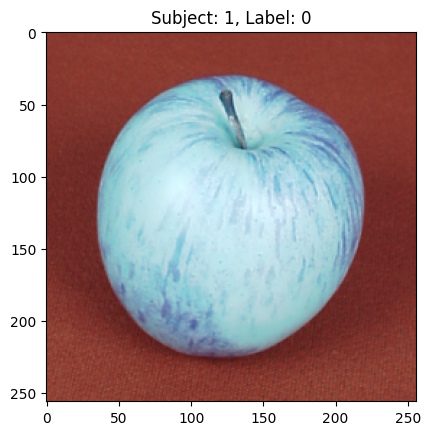

In [2]:
import cv2
import os
import matplotlib.pyplot as plt

def get_data(directory_path):
    data_list = []

    for r, d, f in os.walk(directory_path):
        if len(d) > 0:
            parent = os.path.basename(os.path.dirname(r))
            for file in f:
                if file.endswith(('.jpg', '.jpeg', '.png')):
                    path = os.path.join(r, file)
                    img = cv2.imread(path)

                    # Extract the label from the "maps" folder
                    map_folder_path = os.path.join(r, "maps")
                    label_file = f"{file[:-4]}-map.png"
                    map_label_path = os.path.join(map_folder_path, label_file)
                    label = cv2.imread(map_label_path, cv2.IMREAD_GRAYSCALE)

                    data_list.append((img, parent, label.flatten()[0]))

    return data_list

# Example usage
dataset_path = "/content/ETH-80"
data = get_data(dataset_path)

# Example: Plot the first image
plt.imshow(data[0][0], cmap='gray')
plt.title(f"Subject: {data[0][1]}, Label: {data[0][2]}")
plt.show()


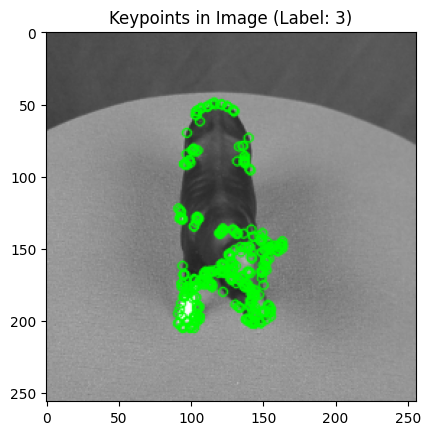

Number of keypoints in Image (Label: 3): 352


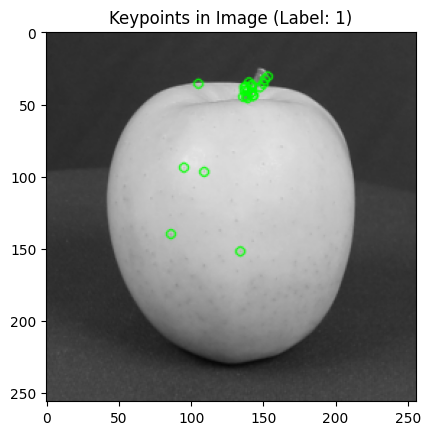

Number of keypoints in Image (Label: 1): 23


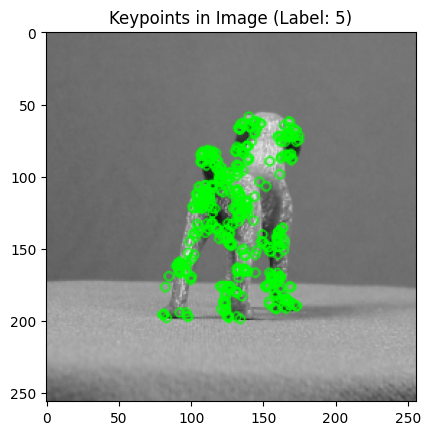

Number of keypoints in Image (Label: 5): 450


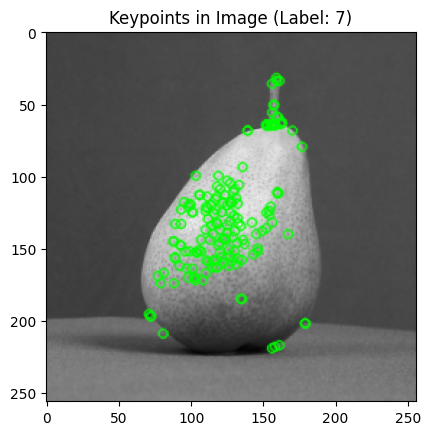

Number of keypoints in Image (Label: 7): 164


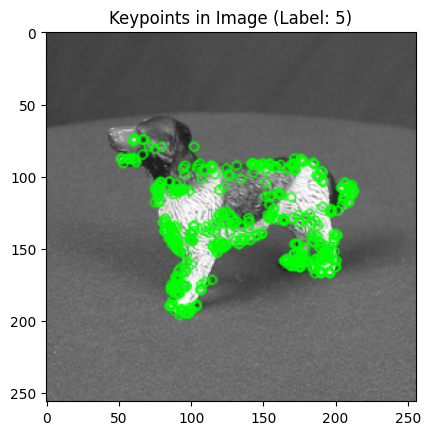

Number of keypoints in Image (Label: 5): 453


In [5]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import random

# Randomly select 5 images from the dataset
random_images = random.sample(data, 5)

for image, label, x in random_images:
    # Convert the image to grayscale
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    # Initiate ORB detector
    orb = cv.ORB_create()

    # Find the keypoints with ORB and compute the descriptors
    kp, des = orb.detectAndCompute(gray_image, None)

    # Draw only keypoints location, not size and orientation
    img_with_keypoints = cv.drawKeypoints(gray_image, kp, None, color=(0, 255, 0), flags=0)

    # Display the image with keypoints
    plt.imshow(cv.cvtColor(img_with_keypoints, cv.COLOR_BGR2RGB))
    plt.title(f"Keypoints in Image (Label: {label})")
    plt.show()

    # Print the number of keypoints in the image
    print(f"Number of keypoints in Image (Label: {label}): {len(kp)}")

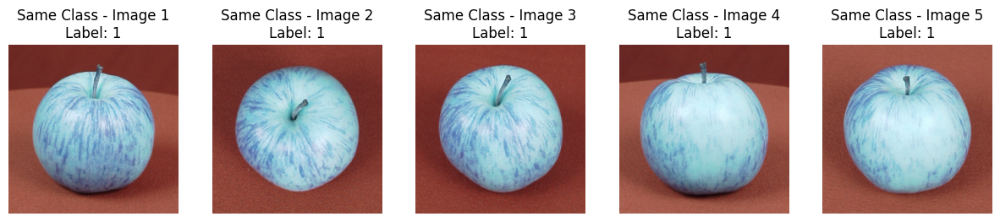

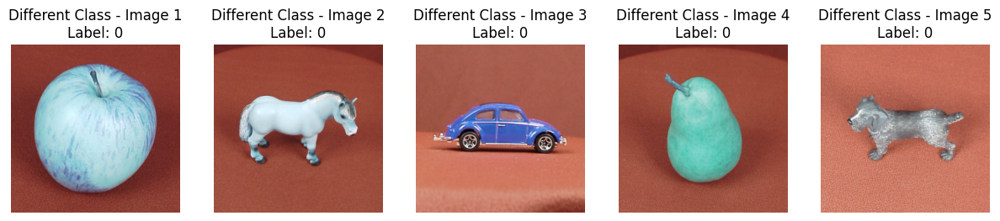

In [ ]:
import matplotlib.pyplot as plt


import random

# # Randomly select 5 images from the dataset
random_images = random.sample(data, 5)

same_class_images = []
same_class = 3

# Select 5 images from the same class
for img, subject_info, label in data:
    if subject_info == same_class:
        same_class_images.append(img)
        if len(same_class_images) == 5:
            break
    else:
        same_class = subject_info

# Plot selected images from the same class
plt.figure(figsize=(15, 5))
for i, img in enumerate(same_class_images):
    plt.subplot(1, 5, i + 1)
    plt.imshow(img, cmap='gray')  # Assuming images are grayscale
    plt.title(f"Same Class - Image {i + 1}\nLabel: {subject_info}")
    plt.axis("off")

plt.show()

different_class_images = []
different_classes = set()

# Select 5 images from different classes
for img, subject_info, label in data:
    if subject_info not in different_classes:
        different_class_images.append(img)
        different_classes.add(subject_info)
        if len(different_class_images) == 5:
            break

# Plot selected images from different classes
plt.figure(figsize=(15, 5))
for i, img in enumerate(different_class_images):
    plt.subplot(1, 5, i + 1)
    plt.imshow(img, cmap='gray')  # Assuming images are grayscale
    plt.title(f"Different Class - Image {i + 1}\nLabel: {label}")
    plt.axis("off")

plt.show()


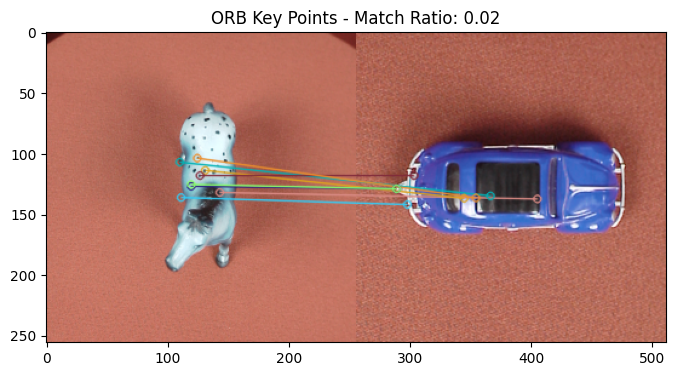

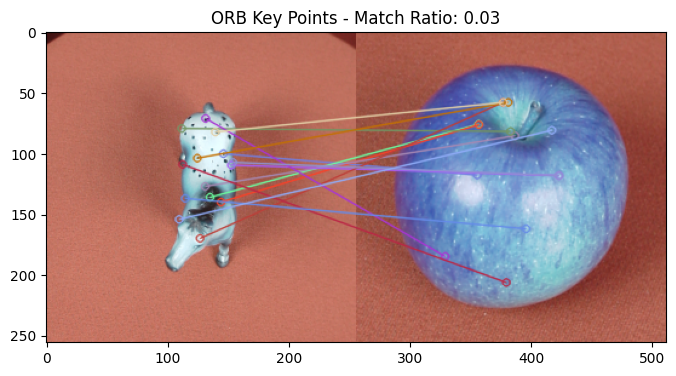

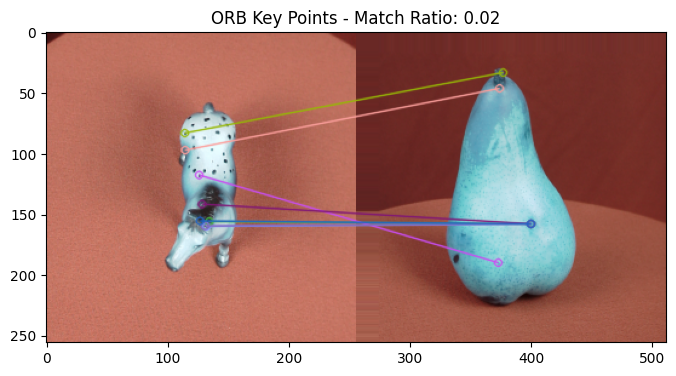

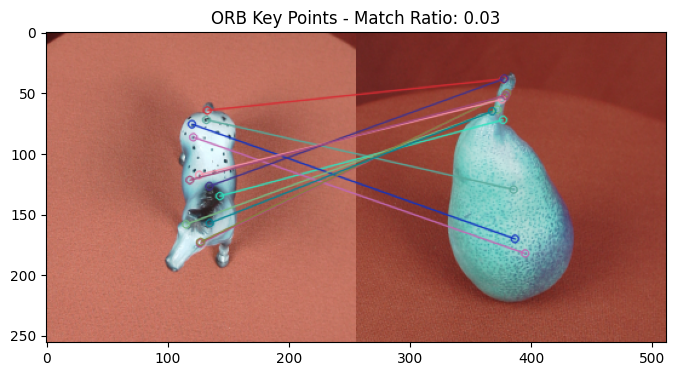

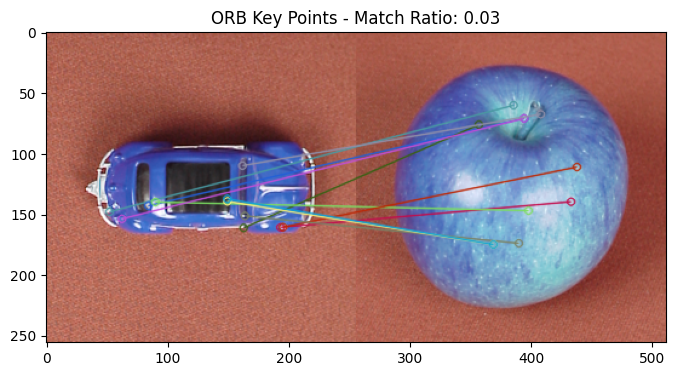

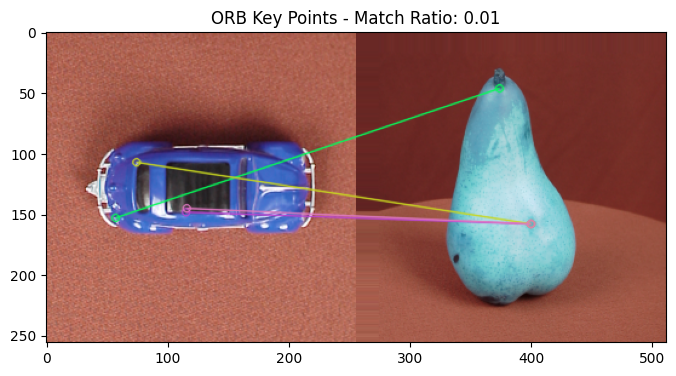

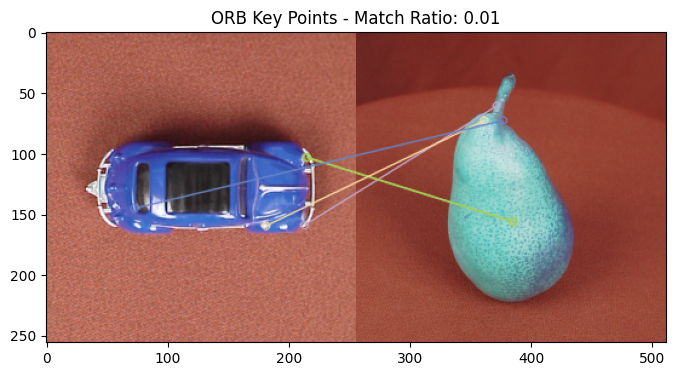

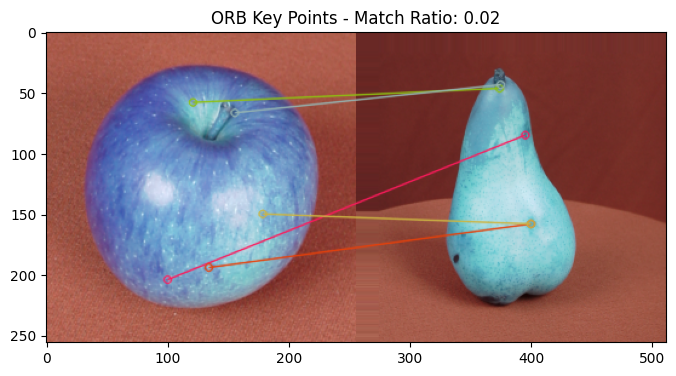

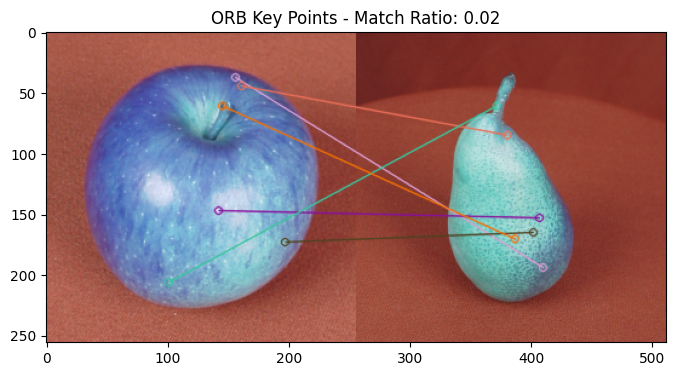

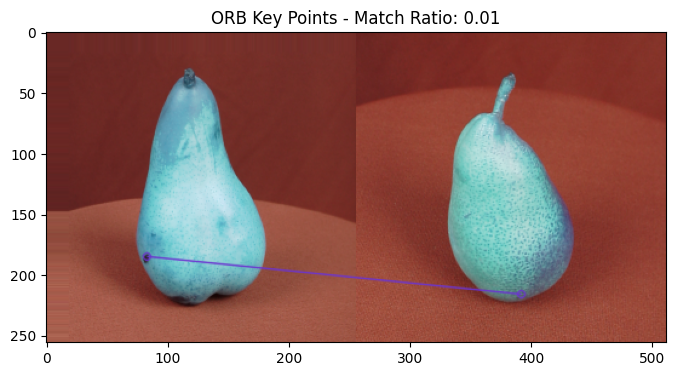

Accuracy: 0.1


In [ ]:
import numpy as np
import cv2 as cv
import random
import matplotlib.pyplot as plt

def calculate_acc(data, threshold):#, algorithm):
    true_positive = 0
    true_negative = 0
    false_positive = 0
    false_negative = 0

    for i in range(len(data)):
        for j in range(i + 1, len(data)):
            image1, label1, _ = data[i]
            image2, label2, _ = data[j]

            feature_extractor = cv.ORB_create()

            kp1, descriptors1 = feature_extractor.detectAndCompute(image1, None)
            kp2, descriptors2 = feature_extractor.detectAndCompute(image2, None)

            bf = cv.BFMatcher()
            matches = bf.knnMatch(descriptors1, descriptors2, k=2)

            good_matches = []
            if len(matches) >= 2:
                for m, n in matches:
                    if m.distance < 0.8 * n.distance:
                        good_matches.append(m)

            match_ratio = len(good_matches) / len(matches) if len(matches) > 0 else 0

            if match_ratio > threshold and label1 == label2:
                true_positive += 1
            elif match_ratio <= threshold and label1 != label2:
                true_negative += 1
            elif match_ratio > threshold and label1 != label2:
                false_positive += 1
            elif match_ratio <= threshold and label1 == label2:
                false_negative += 1

            # Visualize the matches for the last pair of images
            img3 = cv.drawMatchesKnn(image1, kp1, image2, kp2, [good_matches], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.figure(figsize=(8, 8))
            plt.title(f'ORB Key Points - Match Ratio: {match_ratio:.2f}')
            plt.imshow(img3)
            plt.show()

    accuracy = (true_positive + true_negative) / (true_positive + true_negative + false_positive + false_negative)
    return accuracy

# Shuffle the dataset
random.shuffle(data)
# Select the first 5 images from the shuffled dataset
selected_data = data[:5]
# Set the matching ratio threshold
threshold = 0
# Calculate confusion matrix
accuracy = alculate_acc(selected_data, threshold)
# Print the results
print("Accuracy:", accuracy)


In [ ]:
import numpy as np
import cv2 as cv
from tqdm import tqdm
import random

# def calculate_match_ratio(image1, image2, algorithm):
#     gray_image1 = cv.cvtColor(image1, cv.COLOR_BGR2GRAY)
#     gray_image2 = cv.cvtColor(image2, cv.COLOR_BGR2GRAY)

#     # if algorithm == "ORB":
#     feature_extractor = cv.ORB_create()
#     # else:
#         # feature_extractor = cv.SIFT_create()

#     keypoints1, descriptors1 = feature_extractor.detectAndCompute(gray_image1, None)
#     keypoints2, descriptors2 = feature_extractor.detectAndCompute(gray_image2, None)

#     bf = cv.BFMatcher()
#     matches = bf.knnMatch(descriptors1, descriptors2, k=2)

#     good_matches = []
#     if len(matches) >= 2:
#         for m, n in matches:
#             if m.distance < 0.7 * n.distance:
#                 good_matches.append(m)

#     match_ratio = len(good_matches) / len(matches) if len(matches) > 0 else 0
#     return match_ratio

def calculate_confusion_matrix(data, threshold, algorithm):
    true_positive = 0
    true_negative = 0
    false_positive = 0
    false_negative = 0

    total_pairs = len(data) * (len(data) - 1) // 2
    # progress_bar = tqdm(total=total_pairs, desc="Progress", unit="pair")
    # def print_progress(iteration, total, prefix='', suffix='', length=30, fill='█'):
    # percent = ("{0:.1f}").format(100 * (iteration / float(total)))
    # filled_length = int(length * iteration // total)
    # bar = fill * filled_length + '-' * (length - filled_length)
    # print(f'\r{prefix} |{bar}| {percent}% {suffix}', end='\r')
    # if iteration == total:
    #     print()

    # # Example usage:
    # total_pairs = 100  # Replace with your actual total
    # progress_prefix = 'Progress'
    # progress_suffix = 'Complete'
    # for i in range(total_pairs + 1):
    #     print_progress(i, total_pairs, prefix=progress_prefix, suffix=progress_suffix, length=30)
        # Your processing logic here

    for i in range(len(data)):
        for j in range(i + 1, len(data)):
            image1, label1, _ = data[i]
            image2, label2, _ = data[j]

            # # match_ratio = calculate_match_ratio(image1, image2, algorithm)
            # gray_image1 = cv.cvtColor(image1, cv.COLOR_BGR2GRAY)
            # gray_image2 = cv.cvtColor(image2, cv.COLOR_BGR2GRAY)

            # # if algorithm == "ORB":
            feature_extractor = cv.ORB_create()
            # else:
                # feature_extractor = cv.SIFT_create()

            keypoints1, descriptors1 = feature_extractor.detectAndCompute(image1, None)
            keypoints2, descriptors2 = feature_extractor.detectAndCompute(image2, None)

            bf = cv.BFMatcher()
            matches = bf.knnMatch(descriptors1, descriptors2, k=2)

            good_matches = []
            if len(matches) >= 2:
                for m, n in matches:
                    if m.distance < 0.7 * n.distance:
                        good_matches.append(m)

            match_ratio = len(good_matches) / len(matches) if len(matches) > 0 else 0


            if match_ratio > threshold and label1 == label2:
                true_positive += 1
            elif match_ratio <= threshold and label1 != label2:
                true_negative += 1
            elif match_ratio > threshold and label1 != label2:
                false_positive += 1
            elif match_ratio <= threshold and label1 == label2:
                false_negative += 1

            # progress_bar.update(1)

    progress_bar.close()

    accuracy = (true_positive + true_negative) / (true_positive + true_negative + false_positive + false_negative)
    return accuracy#true_positive, true_negative, false_positive, false_negative

# Shuffle the dataset
random.shuffle(data)
# Select the first 100 images from the shuffled dataset
selected_data = data[:100]
# Set the matching ratio threshold
threshold = 0
# Calculate confusion matrix
accuracy = calculate_confusion_matrix(selected_data, threshold, algorithm="ORB")
# Calculate accuracy, precision, recall, and F1-score
# accuracy = (tp + tn) / (tp + tn + fp + fn)
# Print the results
print("Accuracy:", accuracy)
# Print the results
print("ORB Accuracy:", accuracy)


NameError: ignored

In [ ]:

import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from tqdm import tqdm

def calc_match_ratio(img1, img2, algo):
    img1_gray = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
    img2_gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
    if algo == "ORB":
        algo = cv.ORB_create()
    else:
        algo = cv.SIFT_create()
    kp1, des1 = algo.detectAndCompute(img1_gray, None)
    kp2, des2 = algo.detectAndCompute(img2_gray, None)
    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good_matches = []
    if len(matches) >= 2:
        for m, n in matches:
            if m.distance < 0.7 * n.distance:
                good_matches.append(m)
    match_ratio = len(good_matches) / len(matches) if len(matches) > 0 else 0
    return match_ratio

def calc_conf_matrix(data, threshold, algorithm):
    tp = 0
    tn = 0
    fp = 0
    fn = 0
    total_pairs = len(data) * (len(data) - 1) // 2
    progress_bar = tqdm(total=total_pairs, desc="Progress", unit="pair")
    for i in range(len(data)):
        for j in range(i + 1, len(data)):
            img1, label1, l1 = data[i]
            img2, label2, l2 = data[j]
            match_ratio = calc_match_ratio(img1, img2, algorithm)
            if match_ratio > threshold and label1 == label2:
                tp += 1
            elif match_ratio <= threshold and label1 != label2:
                tn += 1
            elif match_ratio > threshold and label1 != label2:
                fp += 1
            elif match_ratio <= threshold and label1 == label2:
                fn += 1
            progress_bar.update(1)
    progress_bar.close()
    return tp, tn, fp, fn

# Shuffle the dataset
random.shuffle(data)
# Select the first 100 images from the shuffled dataset
selected_data = data[:100]
# Set the matching ratio threshold
threshold = 0
# Calculate confusion matrix
tp, tn, fp, fn = calc_conf_matrix(selected_data, threshold, algorithm="ORB")
# Calculate accuracy, precision, recall, and F1-score
accuracy = (tp + tn) / (tp + tn + fp + fn)
# Print the results
print("Accuracy:", accuracy)
# Print the results
print("ORB Accuracy:", accuracy)

Progress: 100%|██████████| 4950/4950 [00:37<00:00, 130.61pair/s]

Accuracy: 0.5668686868686869
ORB Accuracy: 0.5668686868686869


----

fatal: destination path 'ETH-80' already exists and is not an empty directory.


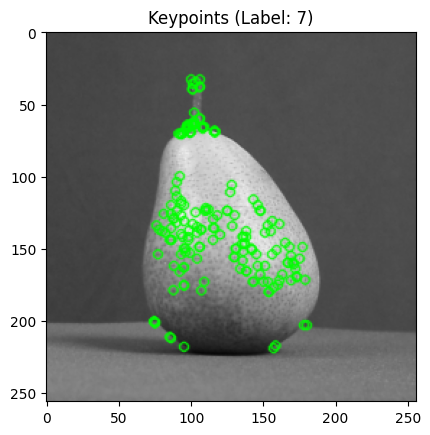

Keypoints Count (Label: 7): 177


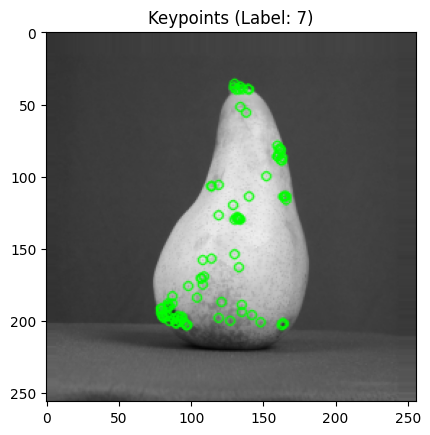

Keypoints Count (Label: 7): 90


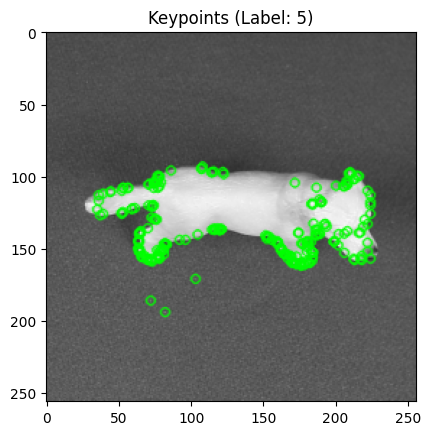

Keypoints Count (Label: 5): 248


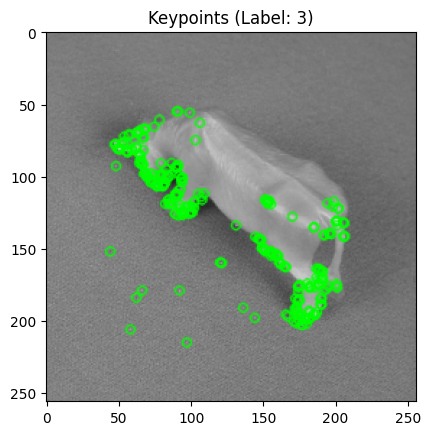

Keypoints Count (Label: 3): 294


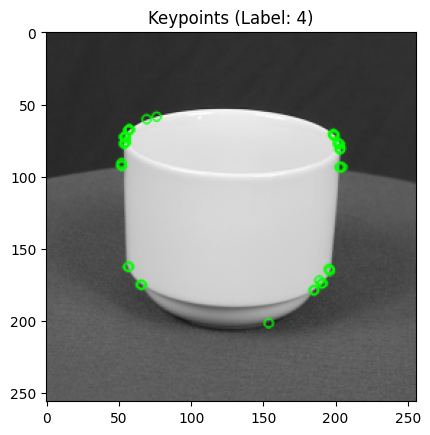

Keypoints Count (Label: 4): 43
Match Ratio (Same Class): 0.024844720496894408


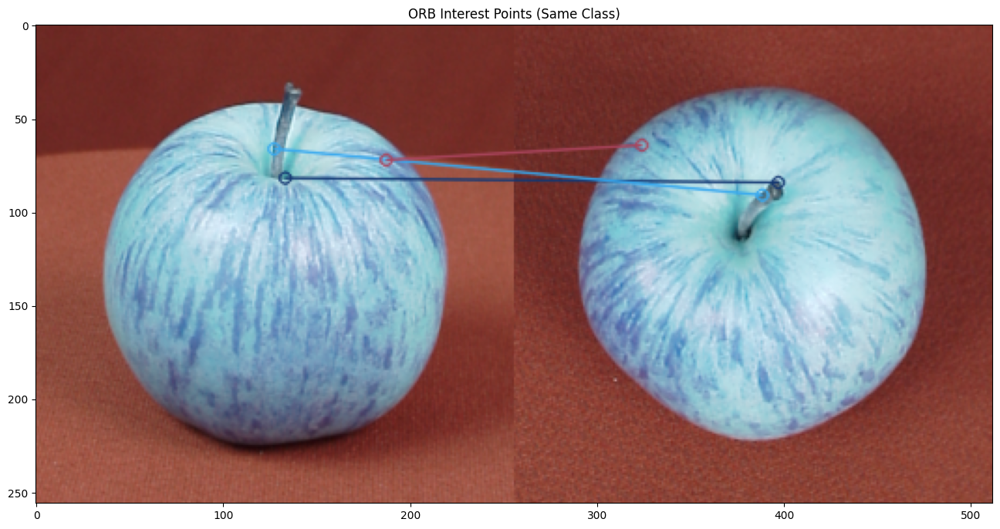

Match Ratio (Same Class): 0.059880239520958084


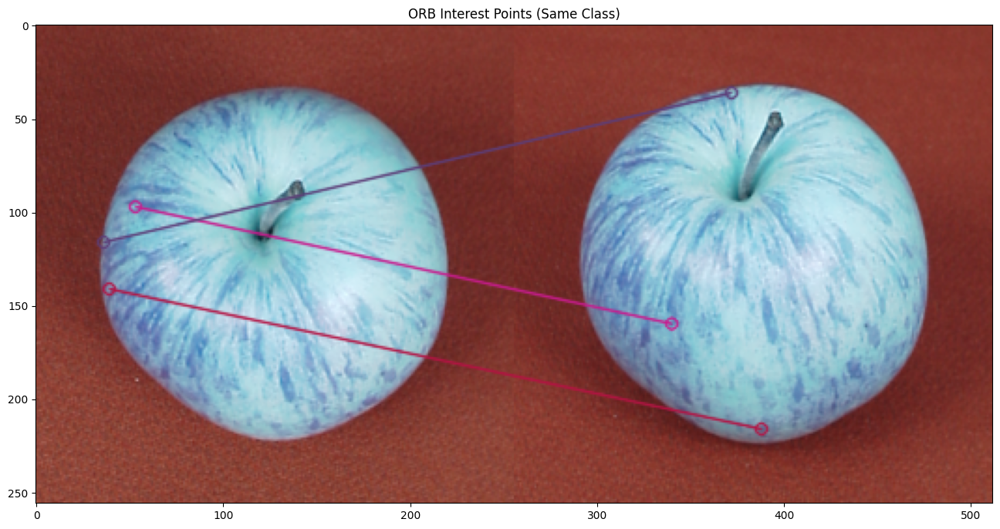

Match Ratio (Same Class): 0.023178807947019868


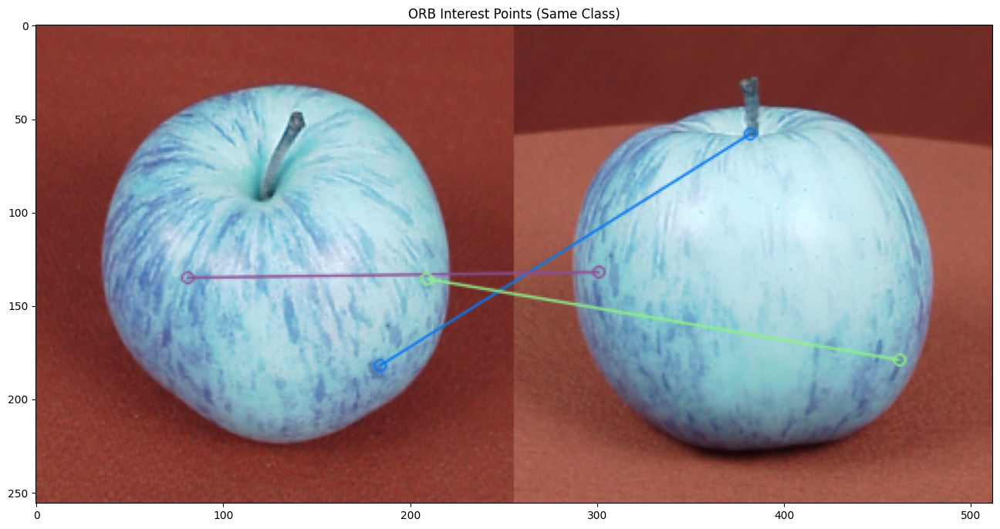

Match Ratio (Same Class): 0.043209876543209874


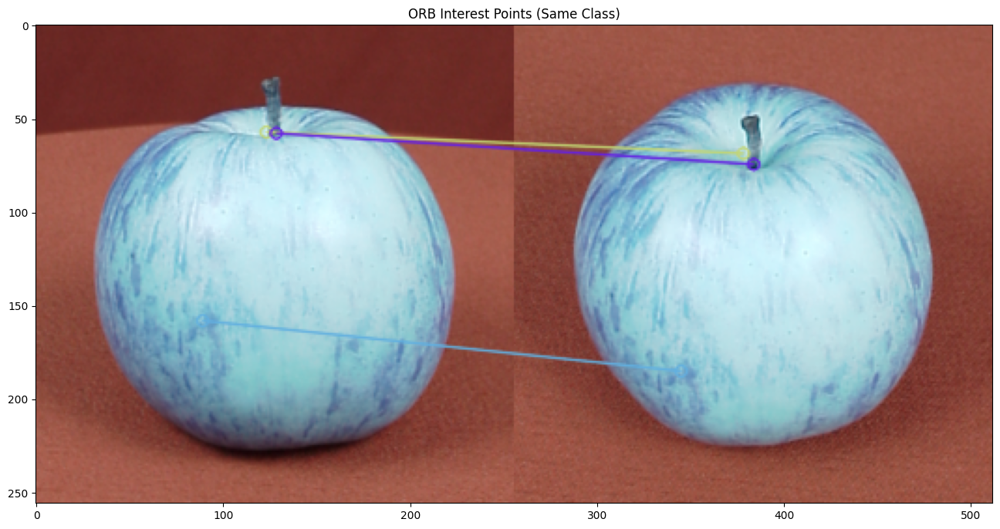

Match Ratio (Same Class): 0.0330188679245283


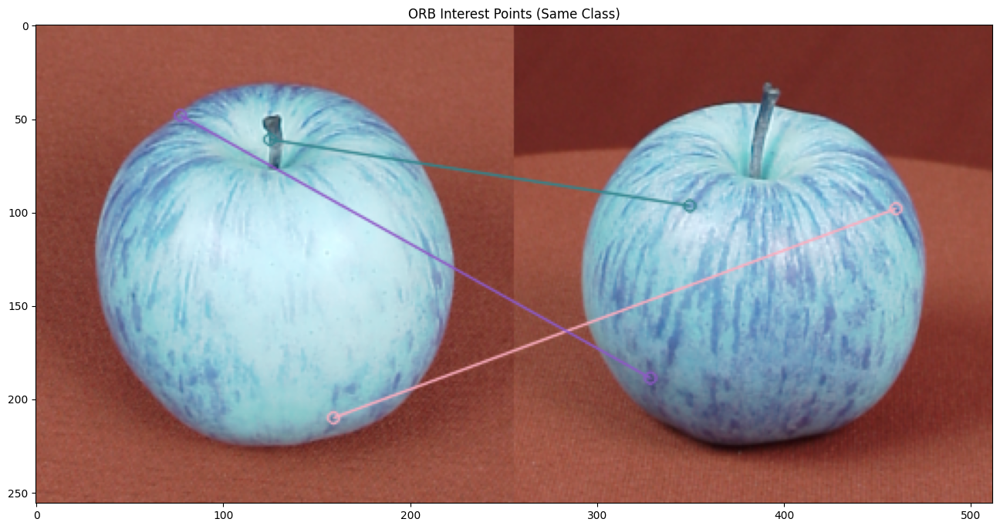

Match Ratio (Diff Classes): 0.0


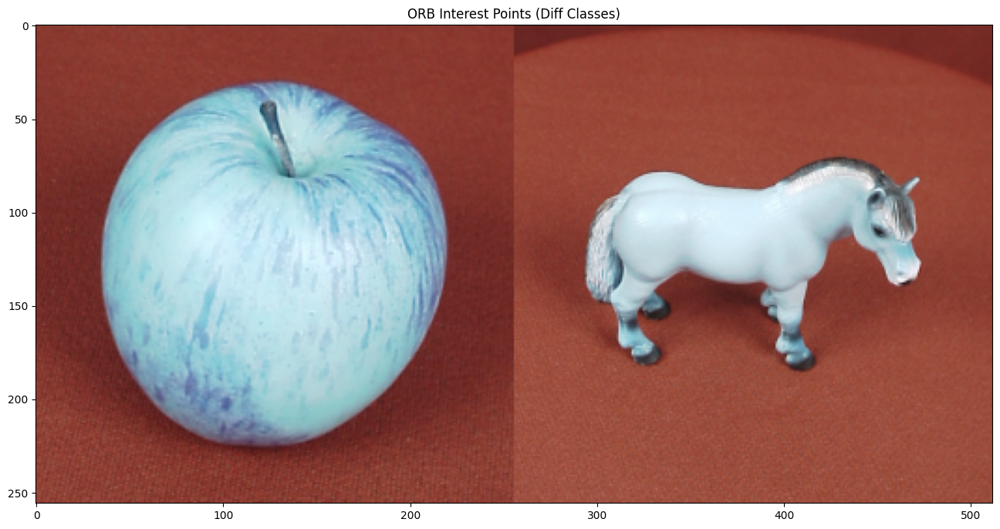

Match Ratio (Diff Classes): 0.0


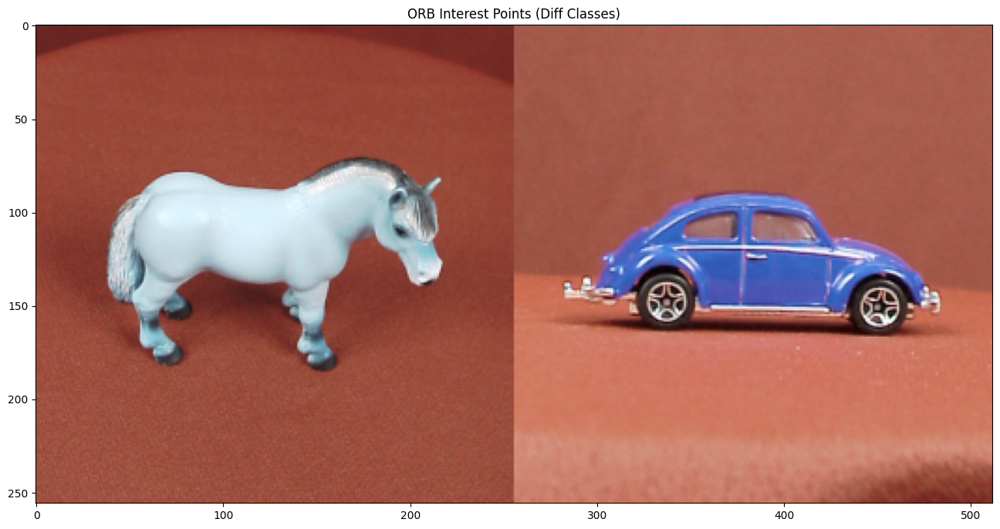

Match Ratio (Diff Classes): 0.0


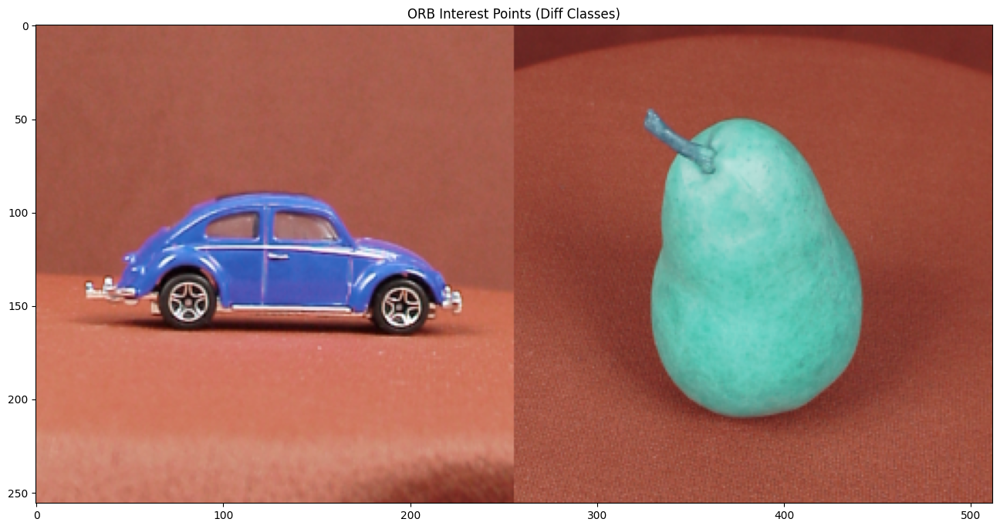

Match Ratio (Diff Classes): 0.0


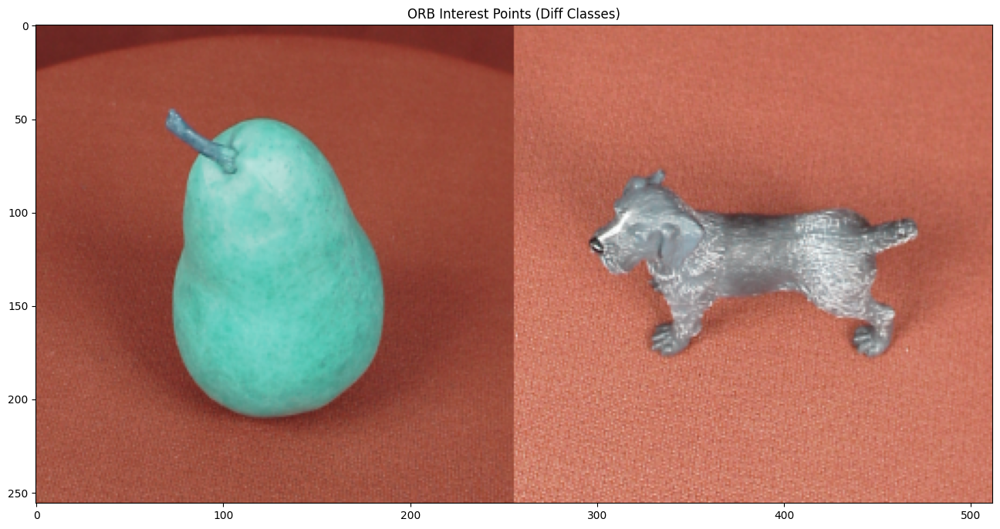

Match Ratio (Diff Classes): 0.0


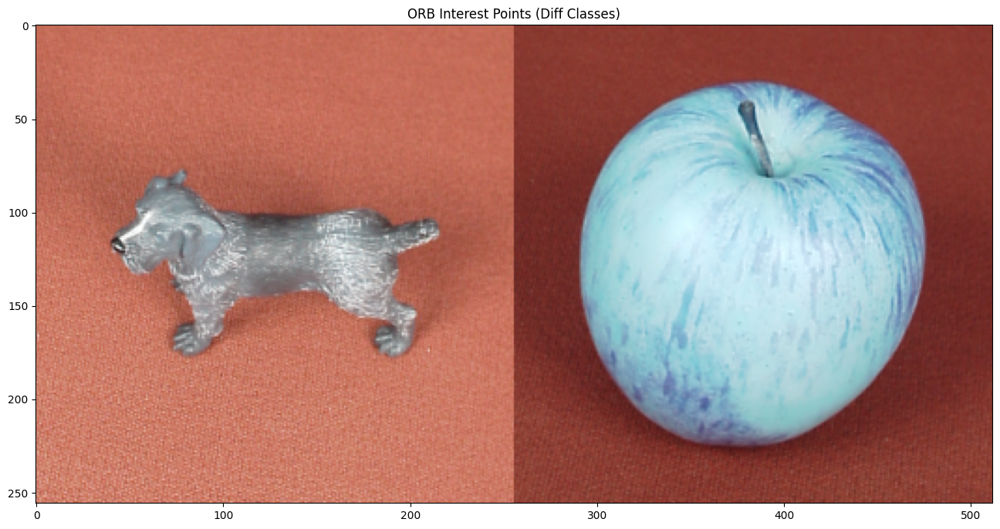

Match Ratio: 0.012084592145015106


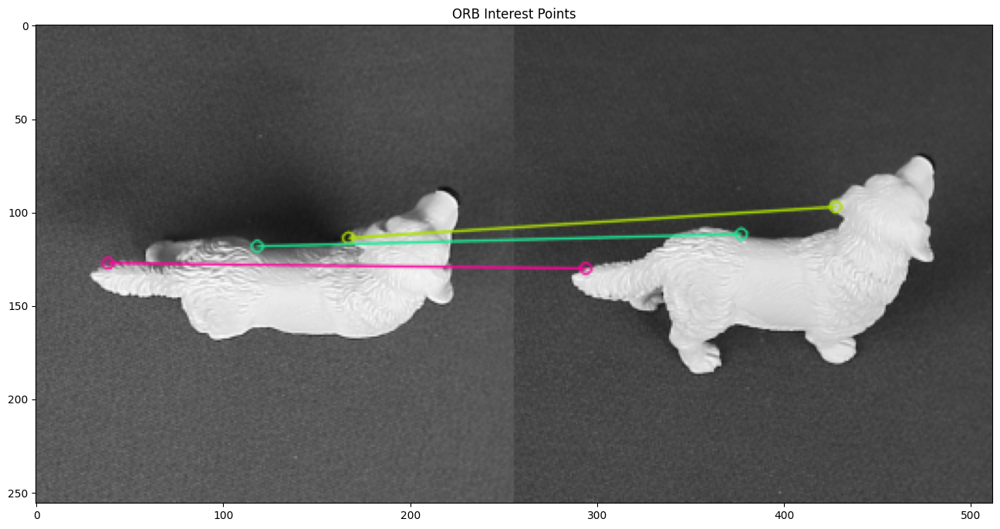

Progress: 100%|██████████| 4950/4950 [01:04<00:00, 77.10pair/s]

Accuracy: 0.5676767676767677
ORB Accuracy: 0.5676767676767677


In [ ]:
# !git clone https://github.com/chenchkx/ETH-80.git
# import os
# import cv2
# import numpy as np

# def get_data(directory_path):
#     data_list = []

#     for r, d, f in os.walk(directory_path):
#         if len(d) > 0:
#             parent = os.path.basename(os.path.dirname(r))
#             for file in f:
#                 if file.endswith(('.jpg', '.jpeg', '.png')):
#                     path = os.path.join(r, file)
#                     img = cv2.imread(path)
#                     data_list.append((img, parent))

#     return data_list

# # Set the root directory path where your folders are located
# root_path = '/content/ETH-80'

# # Call the function to get data and create the dataset
# dataset = get_data(root_path)

# import numpy as np
# import cv2 as cv
# from matplotlib import pyplot as plt
# import random

# # Randomly select 5 images from the dataset
# # random_images = random.sample(dataset, 5)

# for img, label in random_images:
#     gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#     orb = cv.ORB_create()
#     kp, des = orb.detectAndCompute(gray, None)
#     img_with_kp = cv.drawKeypoints(gray, kp, None, color=(0, 255, 0), flags=0)
#     plt.imshow(cv.cvtColor(img_with_kp, cv.COLOR_BGR2RGB))
#     plt.title(f"Keypoints (Label: {label})")
#     plt.show()

#     print(f"Keypoints Count (Label: {label}): {len(kp)}")

# Select 5 images from the same class
# same_class_imgs = []
# same_cls = None
# for img, label in dataset:
#     if label == same_cls:
#         same_class_imgs.append(img)
#         if len(same_class_imgs) == 5:
#             break
#     else:
#         same_cls = label

# # Select 5 images from different classes
# diff_class_imgs = []
# diff_classes = set()
# for img, label in dataset:
#     if label not in diff_classes:
#         diff_class_imgs.append(img)
#         diff_classes.add(label)
#         if len(diff_class_imgs) == 5:
#             break

orb = cv.ORB_create()

for i in range(5):
    img1 = same_class_imgs[i]
    img2 = same_class_imgs[(i + 1) % 5]
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)
    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance:
            good_matches.append(m)
    match_ratio = len(good_matches) / len(matches)
    print("Match Ratio (Same Class):", match_ratio)
    img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, [good_matches[:3]], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(16, 16))
    plt.title('ORB Interest Points (Same Class)')
    plt.imshow(img3)
    plt.show()

for i in range(5):
    img1 = diff_class_imgs[i]
    img2 = diff_class_imgs[(i + 1) % 5]
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)
    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.5 * n.distance:
            good_matches.append(m)
    match_ratio = len(good_matches) / len(matches)
    print("Match Ratio (Diff Classes):", match_ratio)
    img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, [good_matches[:3]], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(16, 16))
    plt.title('ORB Interest Points (Diff Classes)')
    plt.imshow(img3)
    plt.show()

import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img1 = cv.imread('/content/ETH-80/5/3/dog3-000-000.png', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('/content/ETH-80/5/3/dog3-022-000.png', cv.IMREAD_GRAYSCALE)
orb = cv.ORB_create()
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)
bf = cv.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)
match_ratio = len(good_matches) / len(matches)
print("Match Ratio:", match_ratio)
img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, [good_matches[:3]], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(16, 16))
plt.title('ORB Interest Points')
plt.imshow(img3)
plt.show()

import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from tqdm import tqdm

def calc_match_ratio(img1, img2, algo):
    img1_gray = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
    img2_gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
    if algo == "ORB":
        algo = cv.ORB_create()
    else:
        algo = cv.SIFT_create()
    kp1, des1 = algo.detectAndCompute(img1_gray, None)
    kp2, des2 = algo.detectAndCompute(img2_gray, None)
    bf = cv.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good_matches = []
    if len(matches) >= 2:
        for m, n in matches:
            if m.distance < 0.7 * n.distance:
                good_matches.append(m)
    match_ratio = len(good_matches) / len(matches) if len(matches) > 0 else 0
    return match_ratio

def calc_conf_matrix(data, threshold, algorithm):
    tp = 0
    tn = 0
    fp = 0
    fn = 0
    total_pairs = len(data) * (len(data) - 1) // 2
    progress_bar = tqdm(total=total_pairs, desc="Progress", unit="pair")
    for i in range(len(data)):
        for j in range(i + 1, len(data)):
            img1, label1 = data[i]
            img2, label2 = data[j]
            match_ratio = calc_match_ratio(img1, img2, algorithm)
            if match_ratio > threshold and label1 == label2:
                tp += 1
            elif match_ratio <= threshold and label1 != label2:
                tn += 1
            elif match_ratio > threshold and label1 != label2:
                fp += 1
            elif match_ratio <= threshold and label1 == label2:
                fn += 1
            progress_bar.update(1)
    progress_bar.close()
    return tp, tn, fp, fn

# Shuffle the dataset
random.shuffle(dataset)
# Select the first 100 images from the shuffled dataset
selected_data = dataset[:100]
# Set the matching ratio threshold
threshold = 0
# Calculate confusion matrix
tp, tn, fp, fn = calc_conf_matrix(selected_data, threshold, algorithm="ORB")
# Calculate accuracy, precision, recall, and F1-score
accuracy = (tp + tn) / (tp + tn + fp + fn)
# Print the results
print("Accuracy:", accuracy)
# Print the results
print("ORB Accuracy:", accuracy)
